In [5]:
#Audio Processing Libraries
import librosa
import librosa.display
from scipy import signal

#For Playing Audios
import IPython.display as ipd

#Array Processing
import numpy as np

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#Display the confusion matrix
from sklearn.metrics import confusion_matrix

#Display the architecture of our neural networks
import visualkeras
from PIL import ImageFont

#Deal with .pkl files
import pickle

#Create a dataframe
import pandas as pd

#Transform and encode the categorical targets
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

#Split dataset
from sklearn.model_selection import train_test_split

import os

## **The dataset**

### **Airplane**

In [78]:
filename = "Data/Airplane/airplane-fly-over-01_1.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

data : [-0.00091493  0.00355943  0.00410039 ... -0.10916296 -0.20352855
 -0.30204928]
sample_rate : 22050


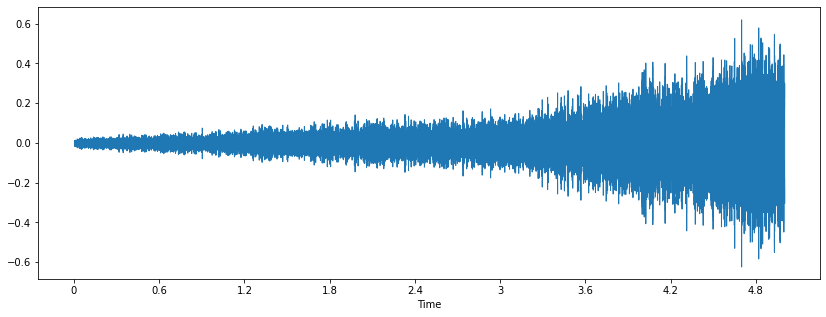

### **Helicopter**

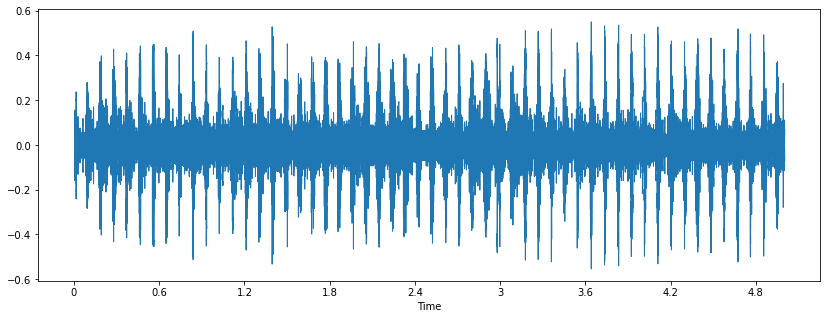

In [8]:
filename = "Data/Helicopter/Helicopter Sound Effect - Flying 5 minutes_54.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Train**

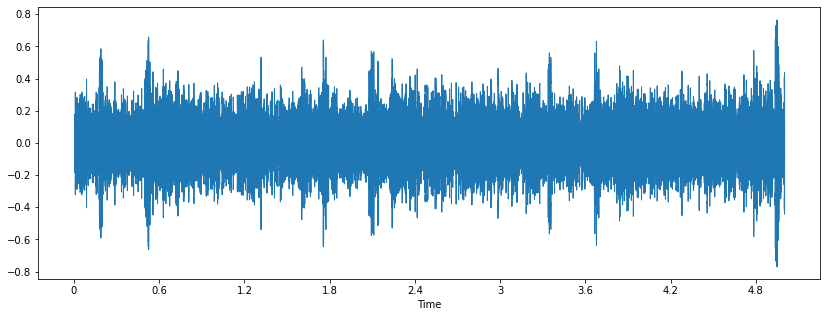

In [9]:
filename = "Data/Train/Train sound 1823.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Motocycle**

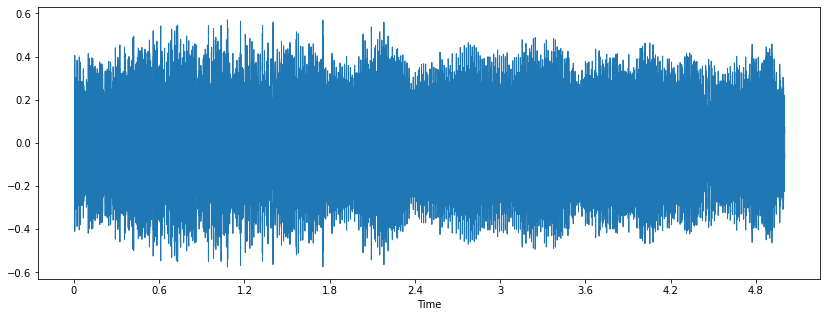

In [12]:
filename = "Data/Motocycles/BIKERS #100 - Best of Superbikes Sounds, Wheelie and Burnout Ultimate Compilation_315.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Bus**

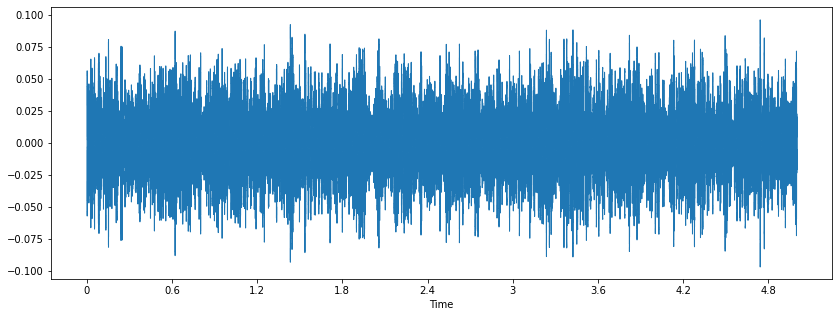

In [13]:
filename = "Data/bus/[Sound] Bus Setra S 516 HD der Fa Neukam-Reba GmbH_005.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Bicycle**

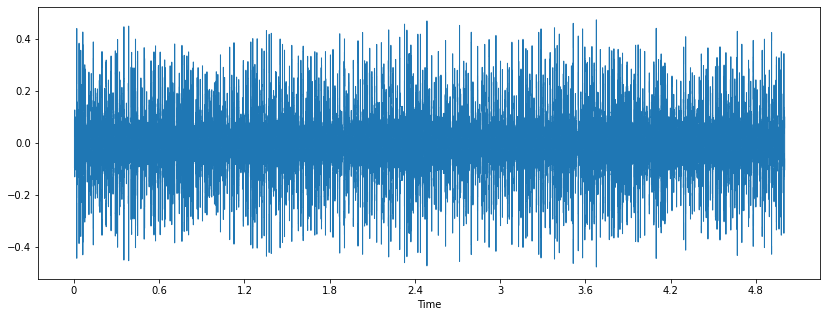

In [15]:
filename = "Data/Bics/Bicycle - Sound Effect - Bicycle Sound - White Noise_295.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Car**

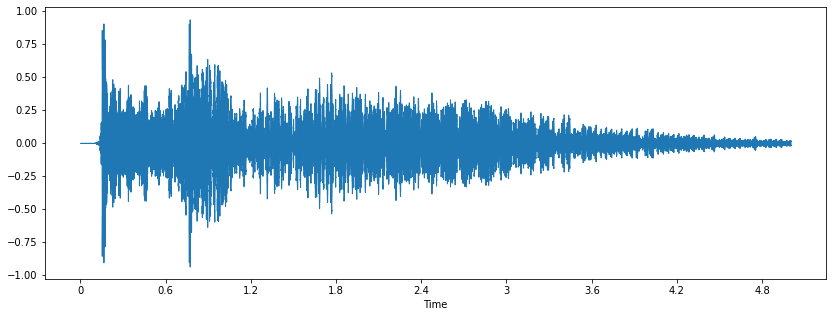

In [16]:
filename = "Data/Cars/mixkit-cars-starting-1561_1.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

### **Truck**

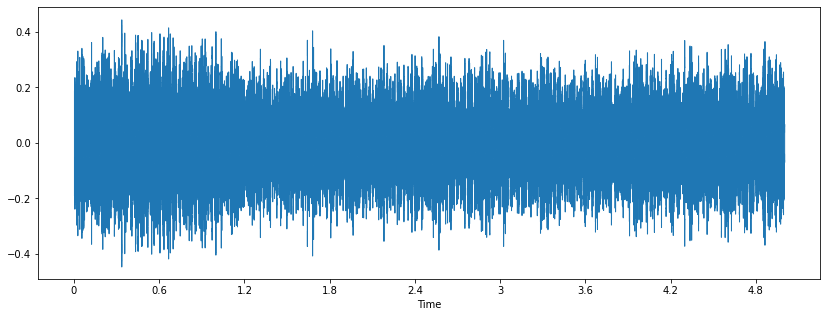

In [17]:
filename = "Data/Truck/mixkit-truck-slowing-down-1620_2.wav"
plt.figure(figsize=(14,5))
data, sample_rate = librosa.load(filename)
librosa.display.waveshow(data, sr=sample_rate)
ipd.Audio(filename)

## **Data Preprocessing**

### **Using the function *features_extractor* to get a 80 MFCCs from each audio**

In [19]:
def features_extractor(file_name):
    audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    mfccs_features = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=80)
    mfccs_scaled_features = np.mean(mfccs_features.T, axis=0)

    return mfccs_scaled_features

### **Now we iterate through every audio file and extract features using *Mel-Frequency Cepstral Coefficients***

In [20]:
audio_dataset_path = 'Data/'

extracted_features = []
for path in os.listdir(audio_dataset_path):
    for file in os.listdir(audio_dataset_path+path+"/"):
        file_name = audio_dataset_path+path+"/"+file
        data = features_extractor(file_name)  
        extracted_features.append([data, path])

### **Save the data frame into a .pkl file to evite repeate the operation**

In [21]:
f = open('PKLS/Extracted_Features.pkl', 'wb')
pickle.dump(extracted_features, f)
f.close()

### **Read the Extracet_Features from the .pkl file**

In [22]:
f = open('PKLS/Extracted_Features.pkl', 'rb')
Data = pickle.load(f)
f.close()

### **Transform *Data* into a dataframe**

In [24]:
df = pd.DataFrame(Data,columns=['feature','class'])
df.head()

,feature,class
0,"[-155.40149, 184.03934, -15.875652, -2.9568698...",Train
1,"[-141.2294, 181.80833, -21.392805, -6.534705, ...",Train
2,"[-142.97868, 181.58702, -21.43682, -6.822848, ...",Train
3,"[-141.05612, 180.53104, -18.31856, -3.2895954,...",Train
4,"[-142.19553, 181.55385, -20.653074, -1.9984903...",Train


In [25]:
df['class'].value_counts()

bus           4221
Train         2552
Airplane       673
Bics           617
Motocycles     537
Helicopter     353
Truck          265
Cars           230
Name: class, dtype: int64

## **Preparing for splitting the data into *train* and *test* sets**

In [26]:
X = np.array(df['feature'].tolist())
Y = np.array(df['class'].tolist())

In [27]:
X.shape

(9448, 80)

In [28]:
Y.shape

(9448,)

### **Label Encoding**

In [34]:
labelencoder = LabelEncoder()
y = to_categorical(labelencoder.fit_transform(Y))

In [35]:
Y[0]

'Train'

In [36]:
y[0]

array([0., 0., 0., 0., 0., 1., 0., 0.], dtype=float32)

### **Split the data**

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y, shuffle=True)


In [39]:
y_train.shape

(6046, 8)

### **Display the shape of each splits**

In [40]:
X_train.shape

(6046, 80)

In [41]:
X_test.shape

(1512, 80)

In [42]:
y_test.shape

(1512, 8)

## **Initialize the moduls**

### **Libreries need for our models**

In [29]:
from keras.layers import *
from keras.models import *
from keras.callbacks import *
from keras import backend as K
from sklearn import metrics
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV
from datetime import datetime

### **Grid Search**

In [30]:
# def display_cv_results(search_results):
#     print('Best score = {:.4f} using {}'.format(search_results.best_score_, search_results.best_params_))
#     means = search_results.cv_results_['mean_test_score']
#     stds = search_results.cv_results_['std_test_score']
#     params = search_results.cv_results_['params']
#     for mean, stdev, param in zip(means, stds, params):
#         print('mean test accuracy +/- std = {:.4f} +/- {:.4f} with: {}'.format(mean, stdev, param))

In [31]:
# ## Trianing my model
# model = cnn()
# model = KerasClassifier(build_fn=model, verbose=1)

# param_grid = {
#     'batch_size': [32, 64],
#     'epochs': [100, 200],
#     'optimizer': ['rmsprop', 'adam'],
#     'activation': ['relu'],
#     'dropout_rate': [0.0, 0.2, 0.4, 0.5]
# }

# start = datetime.now()

# grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=5)
# grid_result = grid.fit(X_train_features, y_train).history

# # print out results
# print('time for grid search = {:.0f} sec'.format(datetime.now() - start))
# display_cv_results(grid_result)

### **CNN**

In [43]:
X_train_features  = X_train.reshape(len(X_train),-1,1)
X_test_features = X_test.reshape(len(X_test),-1,1)
print("Reshaped Array Size", X_train_features.shape)

Reshaped Array Size (6046, 80, 1)


In [44]:
X_train.shape

(6046, 80)

In [46]:
def cnn(optimizer="adam", activation="relu", dropout_rate=0.5):
    K.clear_session()
    inputs = Input(shape=(X_train_features.shape[1], X_train_features.shape[2]))
    
    #First Conv1D layer
    conv = Conv1D(8, 13, padding='same', activation=activation)(inputs)
    if dropout_rate != 0:
        conv = Dropout(dropout_rate)(conv)
    conv = MaxPooling1D(2)(conv)

    #Second Conv1D layer
    conv = Conv1D(16, 11, padding='same', activation=activation)(conv)
    if dropout_rate != 0:
        conv = Dropout(dropout_rate)(conv)
    conv = MaxPooling1D(2)(conv)
    
    #MaxPooling 1D
    conv = GlobalMaxPool1D()(conv)
    
    #Dense Layer 
    conv = Dense(16, activation=activation)(conv)
    outputs = Dense(y_test.shape[1], activation='softmax')(conv)
    
    model = Model(inputs, outputs)
    model.compile(loss='binary_crossentropy',optimizer=optimizer,metrics=['acc'])
    return model

In [57]:
model_cnn = cnn(optimizer="adam", activation="relu", dropout_rate=0)
model_cnn.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 80, 1)]           0         
                                                                 
 conv1d (Conv1D)             (None, 80, 8)             112       
                                                                 
 dropout (Dropout)           (None, 80, 8)             0         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 40, 8)            0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 40, 16)            1424      
                                                                 
 dropout_1 (Dropout)         (None, 40, 16)            0         
                                                             

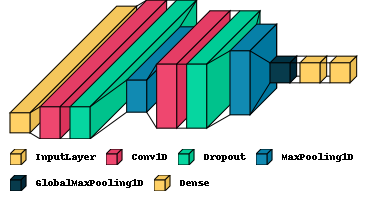

In [56]:
font = ImageFont.load_default()

visualkeras.layered_view(cnn(), legend=True, font=font).show()
visualkeras.layered_view(cnn(), legend=True, font=font, to_file='Neural_networks/CNN_output.png')
visualkeras.layered_view(cnn(), legend=True, font=font, to_file='CNN_output.png')

In [58]:
early_stop = EarlyStopping(monitor='val_accuracy', mode='max', patience=10, restore_best_weights=True)
history = model_cnn.fit(X_train_features, y_train, epochs=200, callbacks=[early_stop],
                  batch_size=64, validation_data=(X_test_features, y_test))

Epoch 1/1000
189/189 [==============================] - 2s 7ms/step - loss: 2.7282 - acc: 0.2989 - val_loss: 0.3349 - val_acc: 0.6143
Epoch 2/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.4691 - acc: 0.4175 - val_loss: 0.3754 - val_acc: 0.4466
Epoch 3/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.3445 - acc: 0.4874 - val_loss: 0.3358 - val_acc: 0.6423
Epoch 4/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.2923 - acc: 0.5665 - val_loss: 0.3027 - val_acc: 0.6481
Epoch 5/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.2563 - acc: 0.6188 - val_loss: 0.2678 - val_acc: 0.6540
Epoch 6/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.2311 - acc: 0.6542 - val_loss: 0.2351 - val_acc: 0.7524
Epoch 7/1000
189/189 [==============================] - 1s 7ms/step - loss: 0.2087 - acc: 0.6718 - val_loss: 0.2196 - val_acc: 0.7799
Epoch 8/1000
189/189 [==============================] - 1s 6ms

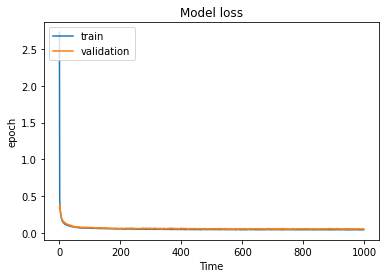

In [59]:
#summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Time')
plt.ylabel('epoch')
plt.legend(['train','validation'], loc='upper left')
plt.show()

In [60]:
_, acc = model_cnn.evaluate(X_test_features, y_test)
print("Test Accuracy:", acc)

60/60 [==============================] - 0s 2ms/step - loss: 0.0520 - acc: 0.9333
Test Accuracy: 0.9333333373069763


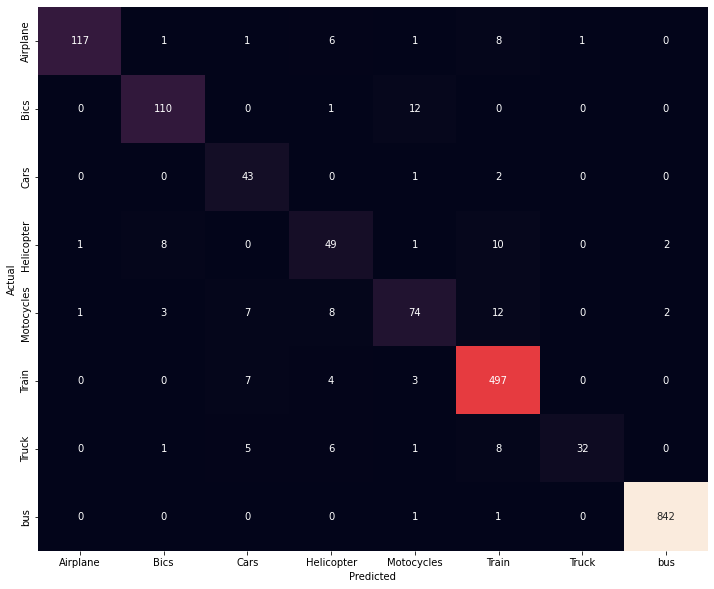

In [61]:
y_pred = model_cnn.predict(X_test_features)

conf_mat = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=labelencoder.classes_, yticklabels=labelencoder.classes_, cbar=False)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [ ]:
model_cnn.save('Models/CNN_Model')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Vehicule Sounds/CNN_Model1/assets


### **LSTM**


In [62]:
x_train_features  = X_train.reshape(len(X_train),-1, 80)
x_test_features = X_test.reshape(len(X_test), -1, 80)
print("Reshaped Array Size", x_train_features.shape)

Reshaped Array Size (6046, 1, 80)


In [63]:
def lstm(x_tr):
    K.clear_session()
    inputs = Input(shape=(x_tr.shape[1], x_tr.shape[2]))
    #lstm
    x = LSTM(128)(inputs)
    x = Dropout(0.5)(x)
    #dense
    x = Dense(64, activation='relu')(x)
    x = Dense(y_test.shape[1], activation='softmax')(x)
    model = Model(inputs, x)
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
    return model

In [64]:
model_lstm = lstm(x_train_features)
model_lstm.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1, 80)]           0         
                                                                 
 lstm (LSTM)                 (None, 128)               107008    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 64)                8256      
                                                                 
 dense_1 (Dense)             (None, 8)                 520       
                                                                 
Total params: 115,784
Trainable params: 115,784
Non-trainable params: 0
_________________________________________________________________


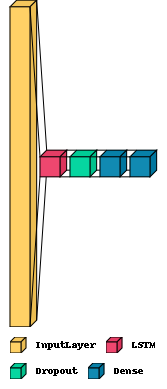

In [65]:
font = ImageFont.load_default()

visualkeras.layered_view(lstm(x_train_features), legend=True, font=font).show()
visualkeras.layered_view(lstm(x_train_features), legend=True, font=font, to_file='Neural_networks/LSTM_output_lstm.png')
visualkeras.layered_view(lstm(x_train_features), legend=True, font=font, to_file='LSTM_output_lstm.png')

In [66]:
mc = ModelCheckpoint('best_model.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='max')

In [73]:
history = model_lstm.fit(x_train_features, y_train, epochs=1000, callbacks=[mc],
                  batch_size=64, validation_data=(x_test_features, y_test))

Epoch 1/1000
89/95 [===========================>..] - ETA: 0s - loss: 0.0054 - acc: 0.9926
Epoch 1: val_acc did not improve from 0.98889
95/95 [==============================] - 1s 6ms/step - loss: 0.0053 - acc: 0.9927 - val_loss: 0.0138 - val_acc: 0.9852
Epoch 2/1000
93/95 [============================>.] - ETA: 0s - loss: 0.0057 - acc: 0.9928
Epoch 2: val_acc did not improve from 0.98889
95/95 [==============================] - 1s 6ms/step - loss: 0.0056 - acc: 0.9929 - val_loss: 0.0132 - val_acc: 0.9878
Epoch 3/1000
85/95 [=========================>....] - ETA: 0s - loss: 0.0043 - acc: 0.9937
Epoch 3: val_acc did not improve from 0.98889
95/95 [==============================] - 1s 6ms/step - loss: 0.0043 - acc: 0.9937 - val_loss: 0.0147 - val_acc: 0.9841
Epoch 4/1000
93/95 [============================>.] - ETA: 0s - loss: 0.0046 - acc: 0.9943
Epoch 4: val_acc did not improve from 0.98889
95/95 [==============================] - 1s 6ms/step - loss: 0.0045 - acc: 0.9944 - val_loss: 0

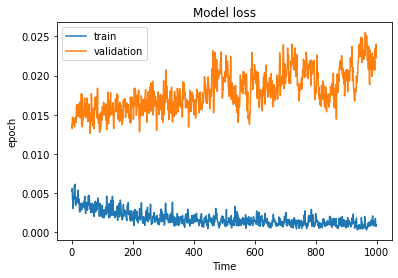

In [74]:
#summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Time')
plt.ylabel('epoch')
plt.legend(['train','validation'], loc='upper left')
plt.show()

In [75]:
_,acc = model_lstm.evaluate(x_test_features, y_test)
print("Accuracy:", acc)

60/60 [==============================] - 0s 2ms/step - loss: 0.0223 - acc: 0.9884
Accuracy: 0.988359808921814


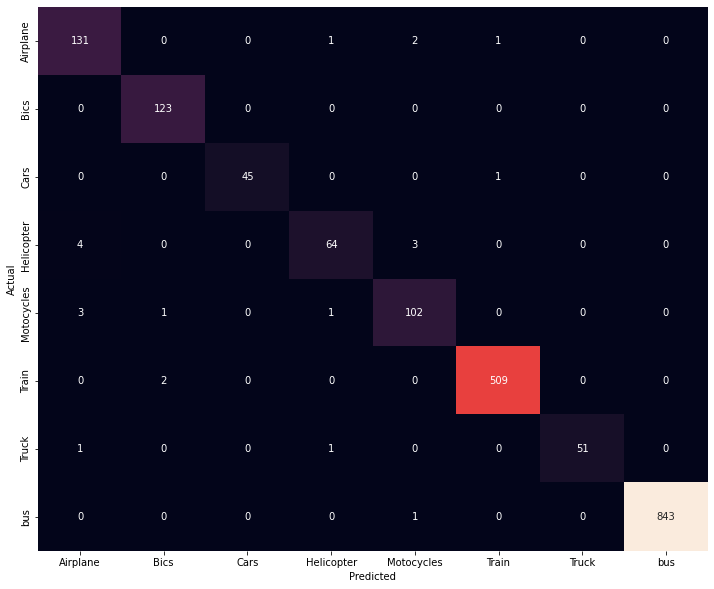

In [76]:
y_pred = model_lstm.predict(x_test_features)

conf_mat = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=labelencoder.classes_, yticklabels=labelencoder.classes_, cbar=False)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [77]:
model_lstm.save('Models/LSTM')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Vehicule Sounds/models/LSTM1/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/Vehicule Sounds/models/LSTM1/assets
